This code is taken from: https://medium.com/@med.taha.elahmar/an-nlp-case-study-with-us-presidents-inaugural-speeches-part-2-2-model-generation-and-evaluation-be235bbf82c3
and
https://github.com/pg2455/U.S-Presidential-Speeches

The code below maps out how we turn hitler's textfile data into a dataframe using markers and text cleaning

In [1]:
from textblob import TextBlob, Word
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from functools import lru_cache
from nltk.corpus import wordnet
import re, json, logging
#import nltk
#nltk.download('omw-1.4')

logging.basicConfig(format = '%(asctime)s : %(levelname)s : %(message)s', level = logging.INFO)
logger = logging.getLogger(__name__)

class speech_to_text(object):
	
	def __init__(self, file_name):
		self.speeches = open(file_name, 'r').read()
		## Lemmatizer with cache
		self.lemmatize = (lru_cache(maxsize = 50000))(WordNetLemmatizer().lemmatize)
		self.exclude = set(stopwords.words('english'))
		self.not_processed =0
		logger.info("Instance created.")

	def store_indices(self):		
		iterable, self.indices  = re.finditer('Adolf Hitler -', self.speeches), [] ## i.start and i.end represent starting and closing indices
		for i in iterable:
			self.indices.append((i.start(), i.end()))
		self.indices.append((len(self.speeches), len(self.speeches)))


	def extract_data(self):
		self.data = []
		for count,(start, end) in enumerate(self.indices):
			try: 
				speech ={}
				sp = self.speeches[ end: self.indices[count+1][0] ]
				speech['what'] = sp[:sp.find('\n')]
				sp = sp[ sp.find('\n')+1 : ]
				#sp = sp[ sp.find('\n') + 1 : ]
				while len(sp[sp.find('\n'):]) == 0:
					sp = sp[ sp.find('\n'): ]
				if len(sp[sp.find('\n') + 2].strip()) == 0:
					sp = sp[ sp.find('\n')+2: ]	
				speech['who'] = sp[:sp.find('\n')]
				sp = sp[ sp.find('\n') + 1 : ]
				while len(sp[sp.find('\n'):]) == 0:
					sp = sp[ sp.find('\n'): ]				
				speech['date']=  sp[:sp.find('\n')+2]
				sp = sp[ sp.find('\n')+2: ]
				while len(sp[sp.find('\n')+2:]) == 0:
					sp = sp[ sp.find('\n'): ]
				speech['speech'] = sp
				'''if len(sp[sp.find('\n') + 1].strip()) == 0:
					sp = sp[ sp.find('\n') + 2 : ]
					speech['date']=  sp[:sp.find('\n')]
					sp = sp[ sp.find('\n') + 3 : ]
					speech['speech'] = sp[:sp.find('\n')]
				else:
					sp = sp[ sp.find('\n') + 1 : ]
					speech['date']=  sp[:sp.find('\n')]
					sp = sp[ sp.find('\n') + 2 : ]
					speech['speech'] = sp[:sp.find('\n')]'''
				self.data.append(speech)
			except IndexError:
				pass

	def save_data(self):
		with open('data_processed2.txt','w') as f:
			f.write(json.dumps(self.data))
		return self.data

	def write_processed_speeches(self):
		with open('all_speech3.txt', 'a') as f:
			for v,i in enumerate(self.data):
				if v%25 ==0:
					#print((i['speech']) + '\n')
					logging.info("Progress: @ %d", v)
					#print(self.clean(i['speech']) + '\n')
				#print(self.clean(i['speech']) + '\n')
				f.write((i['speech']) + '\n')
		logging.info('File saved as all_speeches2.txt')
		return True

	## body clean
	def clean(self, body):
		body =  re.sub('\n',' ', body).strip()
		try:
			body = TextBlob(body)
			tags = body.tags
			tags = [(i[0], pos(i[1])) for i in tags if self.is_word(i[0])] ##store tuples
			words = [self.lemmatize(i, t).lower() for i,t in tags if t]
			return " ".join(words)
		except Exception as e:
			print(e)
			self.not_processed +=1
			return ""

	def is_word(self, word):
		if len(word) <4 or len(word) > 20:
			return False
		if word in self.exclude:
			return False
		return True

'''keep only those words which are | adjective | verb | noun | adverb |'''
def pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return ''


In [2]:
if __name__ == '__main__':
	work = speech_to_text('Adolf Hitler - Collection of Speeches 1922-1945_djvu2.txt')
	work.store_indices()
	work.extract_data()
	data2 = work.save_data()
	work.write_processed_speeches()
	

2023-02-07 09:26:50,039 : INFO : Instance created.
2023-02-07 09:26:50,078 : INFO : Progress: @ 0
2023-02-07 09:26:50,100 : INFO : Progress: @ 25
2023-02-07 09:26:50,104 : INFO : Progress: @ 50
2023-02-07 09:26:50,108 : INFO : Progress: @ 75
2023-02-07 09:26:50,111 : INFO : Progress: @ 100
2023-02-07 09:26:50,115 : INFO : Progress: @ 125
2023-02-07 09:26:50,122 : INFO : Progress: @ 150
2023-02-07 09:26:50,127 : INFO : Progress: @ 175
2023-02-07 09:26:50,132 : INFO : Progress: @ 200
2023-02-07 09:26:50,139 : INFO : Progress: @ 225
2023-02-07 09:26:50,146 : INFO : File saved as all_speeches2.txt


In [3]:
import pandas as pd
data_clean = pd.DataFrame(data2)

2023-02-07 09:26:53,176 : INFO : NumExpr defaulting to 8 threads.


In [31]:
data_clean.head()

,what,who,date,speech
0,speech in Munich,,"April 12, 1922 \n\n",^\ fter the War production had begun again and...
1,speech in Munich,,"July 28, 1922 \n\n",(jjft is a battle which began nearly 120 years...
2,speech in Munich,,"September 18, 1922 \n\n",[excerpt] \n\n(jTf^conomics is a secondary mat...
3,speech in Munich,,"April 10, 1923 \n\n",[excerpt] \n\n(jÂ¥ n the Bible we find the tex...
4,speech in Munich,,"April 13, 1923 \n\n","[excerpt] \n\n(jifn our view, the times when t..."


Below we ensure that we label that the rows are from hitler's speeches. We also data clean unicode and terms that will differ in meaning in churchill's speechs

In [4]:
data_clean["who"] = data_clean.shape[0]*["hitler"]
data_clean_hitler = data_clean

In [5]:
def unicode(text):    
    unicode_text = re.sub(r"(@\[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|^rt|http.+?", "", text)
    return unicode_text

In [6]:
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).lower())
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: unicode(str(x)))
#data_dtm["speech"] = data_dtm["speech"].apply(lambda x: x.replace("volk","people"))

In [7]:
data_clean_hitler["date"] = data_clean_hitler["date"].apply(lambda x: str(x).replace('\n',''))
data_clean_hitler["date"] = data_clean_hitler["date"].apply(lambda x: ",".join(x.split(",")[-2:]) if len(x.split(',')) > 2 else x)
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('\n',' '))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace(' fter','After'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('jtf','E'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('(j','j'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('jjf',' '))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('jif','i'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace(' lat ',' what '))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace(' len ',' when '))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace(' lere ',' where '))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace(' le ',' the '))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace(' y ','My '))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('("his','this'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('jjj',''))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace(' t ',' it  '))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('excerpt',''))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace(' n ',' in '))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace(' f ','if'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace(' j ',' '))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('ij','t'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('germany','our country'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('german','native'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('england','the enemy'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('great britain','the enemy'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('british','the enemy'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('france','the enemy'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('french','the enemy'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('america','the enemy'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('americans','the enemy'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('japan','the allies'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('japanese','the allies'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('hitler','our hero'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('adolf hitler','our hero'))
data_clean_hitler["speech"] = data_clean_hitler["speech"].apply(lambda x: str(x).replace('volk','people'))

In [36]:
data_clean_hitler[0:].head(60)

,what,who,date,speech
0,speech in Munich,hitler,"April 12, 1922",After the war production had begun again and i...
1,speech in Munich,hitler,"July 28, 1922",it is a battle which began nearly 120 years ...
2,speech in Munich,hitler,"September 18, 1922",Economics is a secondary matter world history...
3,speech in Munich,hitler,"April 10, 1923",in the bible we find the text that which is n...
4,speech in Munich,hitler,"April 13, 1923",in our view the times when there was no leagu...
5,speech in Munich,hitler,"April 24, 1923",i reject the word proletariat the jew who coi...
6,speech in Munich,hitler,"April 27, 1923",what we need if we are to have a real peoples...
7,speech in Munich,hitler,"May 01, 1923",ifthe first of may is to be transferred in a...
8,speech in Munich,hitler,"May 04, 1923",my dear fellow natives 9 it r when cuno beca...
9,speech in Munich,hitler,"August 01, 1923",where are two things which can unite men comm...


Below we retrieve the churchill dataset and do the same as above

In [8]:
import pandas as pd
data = pd.read_csv("churchill.csv")
data_clean = pd.DataFrame(data)
data_clean["date"] = data_clean["what"].apply(lambda x: x.split(',')[1:][0])
data_clean["what"] = data_clean["what"].apply(lambda x: ",".join([x.split(',')[0]] + x.split(',')[2:]))
data_clean["who"] = data_clean.shape[0]*["churchill"]
data_clean_churchill = data_clean

In [9]:
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).lower())
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: unicode(str(x)))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('great britain','our country'))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('england','our country'))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('british','native'))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('germany','the enemy'))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('german','the enemy'))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('japan','the enemy'))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('japanese','the enemy'))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('america','the allies'))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('americans','the allies'))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('france','the allies'))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('french','the allies'))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('hitler','the villain'))
data_clean_churchill["speech"] = data_clean_churchill["speech"].apply(lambda x: str(x).replace('adolf hitler','the villain'))

In [10]:
data_clean_churchill

,what,date,speech,who
0,"England', Royal Society of St George,\nLondon",24 April 1933,i am a great admirer of the scots i am quite f...,churchill
1,"Wars come very suddenly', House of Commons",7 February 1934,wars come very suddenly i have lived through a...,churchill
2,"Germany is arming', House of Commons",8 March 1934,i dread the day when the means of threatening ...,churchill
3,"We lie within ... striking distance', Broadcas...",16 November 1934,as we go to and fro in this peaceful country w...,churchill
4,'A corridor of deepening and darkening danger'...,31 May 1935,i agree with sir herbert samuel when he says t...,churchill
...,...,...,...,...
94,"'Government of the people', House of Commons",16 August 1945,in those countries torn and convulsed by war t...,churchill
95,"Alamein, Royal Albert Hall, London",25 October 1945,it is of monty as i have been for some time al...,churchill
96,"WE DID NOT FLINCH; WE DID NOT FAIL',Harrow Sch...",31 October 1945,as a youth i always wanted to play the kettled...,churchill
97,"'The unnecessary war', Belgian Parliament, Bru...",16 November 1945,the ties between our country and belgium found...,churchill


Below we combine the two datasets together, finding the stop words. We do this for hitler and churchill's speeches as well to plot common words

In [11]:
data_clean = pd.concat([data_clean_hitler,data_clean_churchill])

In [12]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(stop_words = 'english')
data_cv = cv.fit_transform(data_clean_hitler.speech)
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm.index = data_clean_hitler[['what','date','who']].apply(lambda x: ':'.join(str(s) for s in x), axis=1)
data_dtm.head()
for c in data_dtm.columns:
    if c.isalpha() == False:
        data_dtm = data_dtm.drop(columns = [c])
data = data_dtm.transpose()
data.head()
len(data)
top_dict = {}
print(data.columns)
for c in data.columns:
    top = data[c].sort_values(ascending=False).head(30)
    top_dict[c] = list(zip(top.index, top.values))
for president, top_words in top_dict.items():
    print(president)
    print(', '.join([word for word, count in top_words[0:14]]))
    print('---')
from collections import Counter
# The top 10 most recurrent words in our speeches
words = []
for president in data.columns:
    top = [word for (word,count) in top_dict[president]]
    for t in top:
        words.append(t)
# List aggregation
Counter(words).most_common(10)

add_stop_words = [word for word, count in Counter(words).most_common() if count > len(data.columns)/2]
add_stop_words

from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer
# Add new stop words
stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)
# Recreate document-term matrix
cv = CountVectorizer(stop_words=[stop_words])
data_cv = cv.fit_transform(data_clean.speech)
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm.index = data_clean[['what','date','who']].apply(lambda x: ':'.join(str(s) for s in x), axis=1)
data_hitler = data

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\IPython\core\interactiveshell.py", line 3433, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\jmcha\AppData\Local\Temp\ipykernel_9000\627786195.py", line 9, in <module>
    data_dtm = data_dtm.drop(columns = [c])
  File "C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\pandas\util\_decorators.py", line 331, in wrapper
    return func(*args, **kwargs)
  File "C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\pandas\core\frame.py", line 5388, in drop
    return super().drop(
  File "C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\s

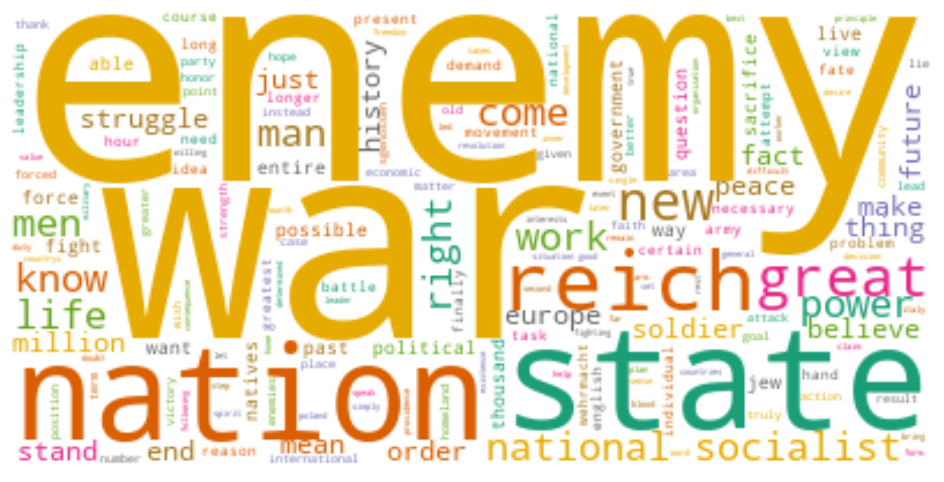

In [195]:
from wordcloud import WordCloud
array = []
wc = WordCloud(stopwords=stop_words, background_color='white', colormap='Dark2', max_font_size=150, random_state=42)
data_clean_hitler.index = data_clean_hitler[['what','date','who']].apply(lambda x: ':'.join(str(s) for s in x), axis=1)
import matplotlib.pyplot as plt
# Create subplots for each speech
for index, speech in enumerate(data_hitler.columns):
    array.append(data_clean_hitler.speech[speech])
array = "".join(array)
removing = ['time', 'world', 'years', 'people', 'today', 'like','shall','year','day',' s ','say','did','does']
for word in removing:
    array = array.replace(word,"")
array = array.replace("jewish","jew")
array = array.replace("jews","jew")
array = array.replace("jewry","jew")
array = array
wc.generate(array)
plt.imshow( wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [42]:
print(data_clean.columns)
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(stop_words = 'english')
data_cv = cv.fit_transform(data_clean_churchill.speech)
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm.index = data_clean_churchill[['what','date','who']].apply(lambda x: ':'.join(str(s) for s in x), axis=1)
data_dtm.head()
for c in data_dtm.columns:
    if c.isalpha() == False:
        data_dtm = data_dtm.drop(columns = [c])
data = data_dtm.transpose()
data.head()
len(data)
top_dict = {}
for c in data.columns:
    top = data[c].sort_values(ascending=False).head(30)
    top_dict[c] = list(zip(top.index, top.values))
for president, top_words in top_dict.items():
    print(president)
    print(', '.join([word for word, count in top_words[0:14]]))
    print('---')
from collections import Counter
# The top 10 most recurrent words in our speeches
words = []
for president in data.columns:
    top = [word for (word,count) in top_dict[president]]
    for t in top:
        words.append(t)
# List aggregation
Counter(words).most_common(10)

add_stop_words = [word for word, count in Counter(words).most_common() if count > len(data.columns)/2]
add_stop_words

from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer
# Add new stop words
stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)
# Recreate document-term matrix
cv = CountVectorizer(stop_words=[stop_words])
data_cv = cv.fit_transform(data_clean_churchill.speech)
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm.index = data_clean[['what','date','who']].apply(lambda x: ':'.join(str(s) for s in x), axis=1)
data_churchill = data

Index(['what', 'who', 'date', 'speech'], dtype='object')
England', Royal Society of St George,
London: 24 April 1933:churchill
country, come, dragon, ought, st, english, george, trade, mention, day, people, native, remain, duty
---
Wars come very suddenly', House of Commons: 7 February 1934:churchill
allies, enemy, air, said, thing, say, great, position, prime, think, government, war, answer, navy
---
Germany is arming', House of Commons: 8 March 1934:churchill
measures, new, years, distant, want, far, world, paragraph, away, stage, heart, empire, arming, come
---
We lie within ... striking distance', Broadcast, London: 16 November 1934:churchill
make, come, country, nation, risks, new, europe, war, years, example, defence, weapon, run, navy
---
'A corridor of deepening and darkening danger', House of Commons: 31 May 1935:churchill
enemy, air, countries, going, people, great, armaments, state, equality, taken, world, policy, let, power
---
'You have unsettled everything ... ', House of

Traceback (most recent call last):
  File "C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\IPython\core\interactiveshell.py", line 3433, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\jmcha\AppData\Local\Temp\ipykernel_35340\3010449149.py", line 43, in <module>
    data_dtm.index = data_clean[['what','date','who']].apply(lambda x: ':'.join(str(s) for s in x), axis=1)
  File "C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\pandas\core\generic.py", line 5915, in __setattr__
    return object.__setattr__(self, name, value)
  File "pandas\_libs\properties.pyx", line 69, in pandas._libs.properties.AxisProperty.__set__
  File "C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\pandas\core\generic.

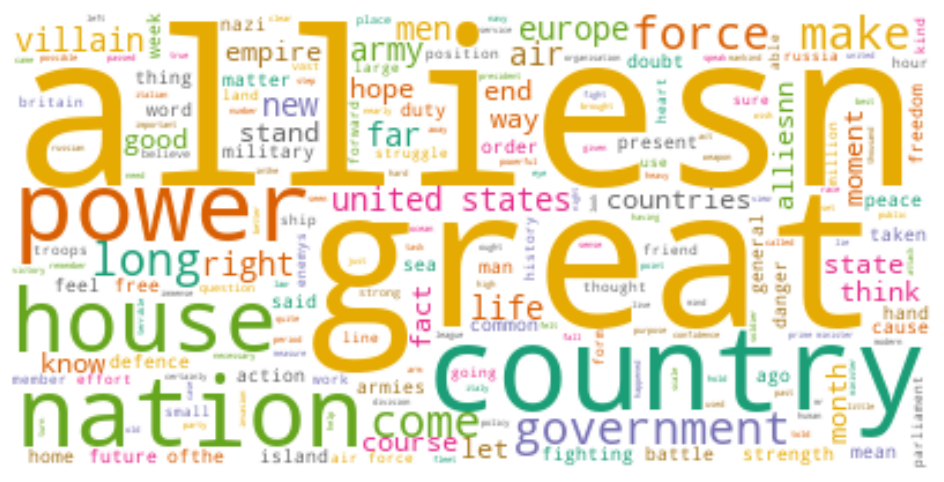

In [199]:
from wordcloud import WordCloud
array = []
wc = WordCloud(stopwords=stop_words, background_color='white', colormap='Dark2', max_font_size=150, random_state=42)
data_clean_churchill.index = data_clean_churchill[['what','date','who']].apply(lambda x: ':'.join(str(s) for s in x), axis=1)
import matplotlib.pyplot as plt
# Create subplots for each speech
for index, speech in enumerate(data_churchill.columns):
    array.append(data_clean_churchill.speech[speech])
array = "".join(array)
removing = ['time', 'world', 'years', 'people', 'today', 'like','shall','year','day',' s ','say','did','does']
for word in removing:
    array = array.replace(word,"")
array = array.replace("alliesn","allies")
wc.generate(array)
plt.imshow( wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [13]:
data_clean["speech"] = data_clean["speech"].apply(lambda x: x.replace("jewish","jew"))
data_clean["speech"] = data_clean["speech"].apply(lambda x: x.replace("jewry","jew"))
data_clean["speech"] = data_clean["speech"].apply(lambda x: x.replace("jews","jew"))
data_clean["speech"] = data_clean["speech"].apply(lambda x: x.replace("alliesn","allies"))
data_clean["speech"] = data_clean["speech"].apply(lambda x: x.replace("enemieswho","enemy"))

In [14]:
import string
def clean_text(text):
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), ' ', text)
    text = re.sub('[\d\n]', ' ', text)
    return text
round1 = lambda x: clean_text(x).strip()
data_clean['speech'] = data_clean.speech.apply(round1)
data_clean.head()

,what,who,date,speech
0,speech in Munich,hitler,"April 12, 1922",after the war production had begun again and i...
1,speech in Munich,hitler,"July 28, 1922",it is a battle which began nearly years a...
2,speech in Munich,hitler,"September 18, 1922",economics is a secondary matter world history ...
3,speech in Munich,hitler,"April 10, 1923",in the bible we find the text that which is ne...
4,speech in Munich,hitler,"April 13, 1923",in our view the times when there was no league...


In [15]:


print(data_clean.columns)
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(stop_words = 'english')
data_cv = cv.fit_transform(data_clean.speech)
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm.index = data_clean[['what','date','who']].apply(lambda x: ':'.join(str(s) for s in x), axis=1)
data_dtm.head()
for c in data_dtm.columns:
    if c.isalpha() == False:
        data_dtm = data_dtm.drop(columns = [c]) 
data = data_dtm.transpose()
data.head()
len(data)
top_dict = {}
print(data.columns)
for c in data.columns:
    top = data[c].sort_values(ascending=False).head(30)
    top_dict[c] = list(zip(top.index, top.values))
for president, top_words in top_dict.items():
    print(president)
    print(', '.join([word for word, count in top_words[0:14]]))
    print('---')
from collections import Counter
# The top 10 most recurrent words in our speeches
words = []
for president in data.columns:
    top = [word for (word,count) in top_dict[president]]
    for t in top:
        words.append(t)
#print(words)  
# List aggregation
Counter(words).most_common(10)
with open("hello.txt", "w") as f:
    f.write(str(words))
add_stop_words = [word for word, count in Counter(words).most_common() if count > len(data.columns)/2]
add_stop_words

from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer
# Add new stop words
stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)
# Recreate document-term matrix
cv = CountVectorizer(stop_words=[stop_words])
data_cv = cv.fit_transform(data_clean.speech)
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm.index = data_clean[['what','date','who']].apply(lambda x: ':'.join(str(s) for s in x), axis=1)

Index(['what', 'who', 'date', 'speech'], dtype='object')
Index([' speech in Munich :April 12, 1922 :hitler',
       ' speech in Munich :July 28, 1922 :hitler',
       ' speech in Munich :September 18, 1922 :hitler',
       ' speech in Munich :April 10, 1923 :hitler',
       ' speech in Munich :April 13, 1923 :hitler',
       ' speech in Munich :April 24, 1923 :hitler',
       ' speech in Munich :April 27, 1923 :hitler',
       ' speech in Munich :May 01, 1923 :hitler',
       ' speech in Munich :May 04, 1923 :hitler',
       ' speech in Munich :August 01, 1923 :hitler',
       ...
       'General Eisenhower, Mansion House, London: 12 June 1945:churchill',
       ''Dear Desert Rats', Winston Club, Berlin: 21 July 1945:churchill',
       'Resignation, 10 Downing Street: 26 July 1945:churchill',
       'The atomic bomb, 10 Downing Street: 6 August 1945:churchill',
       'Surrender of Japan, House of Commons: 15 August 1945:churchill',
       ''Government of the people', House of Commons:

In [16]:
data_dtm

,aaa,aachen,aand,abandon,abandoned,abandonedall,abandoning,abandonment,abandons,abate,...,zionists,zipfelmutze,zog,zollverein,zone,zones,zoo,zuchtung,zulu,zuruckgeschossen
"speech in Munich :April 12, 1922 :hitler",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"speech in Munich :July 28, 1922 :hitler",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"speech in Munich :September 18, 1922 :hitler",0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"speech in Munich :April 10, 1923 :hitler",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"speech in Munich :April 13, 1923 :hitler",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"'Government of the people', House of Commons: 16 August 1945:churchill",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Alamein, Royal Albert Hall, London: 25 October 1945:churchill",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"WE DID NOT FLINCH; WE DID NOT FAIL',Harrow School :31 October 1945:churchill",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"'The unnecessary war', Belgian Parliament, Brussels: 16 November 1945:churchill",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


We find unique words along with nouns and adjectives in our text

In [17]:
unique_list = []
print(len(data.columns))
for speech in data.columns:
    uniques = data[speech].to_numpy().nonzero()[0].size
    unique_list.append(uniques)
# Create a new dataframe that contains this unique word count
data_words = pd.DataFrame(list(zip(data.columns, unique_list)), columns=['speech', 'unique_words'])
data_unique_sort = data_words.sort_values(by='unique_words', ascending=False)

347


In [18]:
from nltk import word_tokenize, pos_tag
yo = []
def nouns_adjs(text):
    '''Given a string of text, tokenize the text and pull out only the nouns.'''
    is_noun_adj = lambda pos: pos[:2] == 'NN' or pos[:2] == 'JJ'
    tokenized = word_tokenize(text)
    all_nouns_adjs = [word for (word, pos) in pos_tag(tokenized) if is_noun_adj(pos)]
    return ' '.join(all_nouns_adjs)
# Apply the nouns function to the transcripts to filter only on nouns and adjectives
data_nouns_adjs = pd.DataFrame(data_clean.speech.apply(nouns_adjs))
data_nouns_adjs.head()

,speech
0,war production better times great years war re...
1,battle years moment jew citizen rights europea...
2,economics secondary matter world history teach...
3,bible text hot cold jj mouth utterance great n...
4,view times league nations more jj honourable h...


In [19]:
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer
# Re-add the additional stop words since we are recreating the document-term matrix
stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)
# Recreate a document-term matrix with nouns and adjectives
cvna = CountVectorizer(stop_words=[stop_words])

data_cvna = cvna.fit_transform(data_nouns_adjs.speech)
data_dtmna  = pd.DataFrame(data_cvna.toarray(), columns=cvna.get_feature_names_out())
data_dtmna.index = data_nouns_adjs.index
data_dtmna.head()

,aaa,aachen,aand,abandon,abandonedall,abandonment,abbeville,abbeydivision,abdication,abduction,...,zionists,zipfelmutze,zog,zollverein,zone,zones,zoo,zuchtung,zulu,zuruckgeschossen
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [213]:
data_dtm
#data_dtmna.to_csv("topics.csv")

,aaa,aachen,aand,abandon,abandoned,abandonedall,abandoning,abandonment,abandons,abate,...,zionists,zipfelmutze,zog,zollverein,zone,zones,zoo,zuchtung,zulu,zuruckgeschossen
"speech in Munich :April 12, 1922 :hitler",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"speech in Munich :July 28, 1922 :hitler",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"speech in Munich :September 18, 1922 :hitler",0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"speech in Munich :April 10, 1923 :hitler",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"speech in Munich :April 13, 1923 :hitler",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"'Government of the people', House of Commons: 16 August 1945:churchill",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Alamein, Royal Albert Hall, London: 25 October 1945:churchill",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"WE DID NOT FLINCH; WE DID NOT FAIL',Harrow School :31 October 1945:churchill",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"'The unnecessary war', Belgian Parliament, Brussels: 16 November 1945:churchill",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


We create our corpus and id2word for our LDA topic modelling

In [20]:
from gensim import matutils, models
import scipy.sparse
corpusna = matutils.Sparse2Corpus(scipy.sparse.csr_matrix(data_dtmna.transpose()))
# Create the vocabulary dictionary
id2wordna = dict((v, k) for k, v in cvna.vocabulary_.items())

C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")
2023-02-07 09:28:44,369 : INFO : 'pattern' package not found; tag filters are not available for English


Below is used for topic modelling and hyper paramter tuning by finding our coherence

In [21]:
from gensim.models import CoherenceModel
#coherence_model_lda = CoherenceModel(model=ldana, texts=cvna.vocabulary_.items(), dictionary=id2wordna, coherence='c_v')
#coherence_lda = coherence_model_lda.get_coherence()
#print('Coherence Score: ', coherence_lda)
# supporting function
def compute_coherence_values(corpus, dictionary, k, a, b):
    
    lda_model = models.LdaModel(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=a,
                                           eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=cvna.vocabulary_.items(), dictionary=dictionary, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [22]:

from gensim import corpora
d = corpora.Dictionary()
d.id2token = id2wordna
d.token2id = dict((k, v) for k, v in cvna.vocabulary_.items())

In [26]:
import numpy as np
import tqdm

grid = {}
grid['Validation_Set'] = {}

# Topics range
min_topics = 2
max_topics = 9
step_size = 1
topics_range = range(min_topics, max_topics, step_size)

# Alpha parameter
alpha = list(np.arange(0.01, 1, 0.3))
alpha.append('symmetric')
alpha.append('asymmetric')

# Beta parameter
beta = list(np.arange(0.01, 1, 0.3))
beta.append('symmetric')

# Validation sets
num_of_docs = len(corpusna)
corpus_sets = [corpusna]

corpus_title = ['100% Corpus']

model_results = {'Validation_Set': [],
                 'Topics': [],
                 'Alpha': [],
                 'Beta': [],
                 'Coherence': []
                }

# Can take a long time to run
if 1 == 1:
    pbar = tqdm.tqdm(total=(len(beta)*len(alpha)*len(topics_range)*len(corpus_title)))
    
    # iterate through validation corpuses
    for i in range(len(corpus_sets)):
        # iterate through number of topics
        for k in topics_range:
            pd.DataFrame(model_results).to_csv('lda_tuning_results.csv', index=False)
            # iterate through alpha values
            for a in alpha:
                # iterare through beta values
                for b in beta:
                    # get the coherence score for the given parameters
                    cv = compute_coherence_values(corpus=corpus_sets[i], dictionary=d, 
                                                  k=k, a=a, b=b)
                    # Save the model results
                    model_results['Validation_Set'].append(corpus_title[i])
                    model_results['Topics'].append(k)
                    model_results['Alpha'].append(a)
                    model_results['Beta'].append(b)
                    model_results['Coherence'].append(cv)
                    
                    pbar.update(1)
    pd.DataFrame(model_results).to_csv('lda_tuning_results.csv', index=False)
    pbar.close()

  0%|          | 0/210 [00:15<?, ?it/s]
2023-02-07 09:30:26,594 : INFO : using serial LDA version on this node
2023-02-07 09:30:26,601 : INFO : running online (multi-pass) LDA training, 2 topics, 10 passes over the supplied corpus of 347 documents, updating model once every 100 documents, evaluating perplexity every 347 documents, iterating 50x with a convergence threshold of 0.001000
2023-02-07 09:30:26,608 : INFO : PROGRESS: pass 0, at document #100/347
2023-02-07 09:30:26,808 : INFO : merging changes from 100 documents into a model of 347 documents
2023-02-07 09:30:26,814 : INFO : topic #0 (0.010): 0.033*"people" + 0.024*"native" + 0.016*"country" + 0.010*"national" + 0.008*"world" + 0.008*"reich" + 0.008*"other" + 0.007*"today" + 0.007*"years" + 0.007*"nation"
2023-02-07 09:30:26,815 : INFO : topic #1 (0.010): 0.020*"native" + 0.018*"people" + 0.013*"country" + 0.010*"world" + 0.008*"state" + 0.008*"time" + 0.007*"today" + 0.007*"national" + 0.007*"years" + 0.006*"government"
2023-

In [140]:
import warnings
warnings.filterwarnings('ignore')

In [227]:
lda_model = models.LdaModel(corpus=corpusna, num_topics =4 , id2word=id2wordna, passes=10, alpha=0.61,eta=0.1)
lda_model.print_topics()

2023-02-07 04:56:55,911 : INFO : using symmetric eta at 0.2
2023-02-07 04:56:55,915 : INFO : using serial LDA version on this node
2023-02-07 04:56:55,928 : INFO : running online (multi-pass) LDA training, 5 topics, 10 passes over the supplied corpus of 347 documents, updating model once every 347 documents, evaluating perplexity every 347 documents, iterating 50x with a convergence threshold of 0.001000
2023-02-07 04:56:58,790 : INFO : -10.682 per-word bound, 1642.7 perplexity estimate based on a held-out corpus of 347 documents with 202396 words
2023-02-07 04:56:58,791 : INFO : PROGRESS: pass 0, at document #347/347
2023-02-07 04:56:59,460 : INFO : topic #0 (0.100): 0.021*"native" + 0.015*"people" + 0.008*"enemy" + 0.008*"country" + 0.007*"war" + 0.007*"time" + 0.006*"reich" + 0.006*"years" + 0.006*"great" + 0.006*"world"
2023-02-07 04:56:59,462 : INFO : topic #1 (0.100): 0.021*"people" + 0.018*"native" + 0.013*"country" + 0.009*"enemy" + 0.009*"world" + 0.008*"today" + 0.007*"time" 

[(0,
  '0.014*"allies" + 0.011*"enemy" + 0.008*"war" + 0.007*"native" + 0.006*"air" + 0.006*"united" + 0.005*"time" + 0.005*"many" + 0.005*"house" + 0.005*"great"'),
 (1,
  '0.027*"people" + 0.022*"native" + 0.014*"country" + 0.010*"today" + 0.009*"world" + 0.009*"national" + 0.008*"years" + 0.008*"time" + 0.007*"reich" + 0.007*"great"'),
 (2,
  '0.011*"enemy" + 0.007*"people" + 0.006*"native" + 0.006*"war" + 0.006*"allies" + 0.005*"time" + 0.004*"great" + 0.004*"years" + 0.004*"country" + 0.004*"power"'),
 (3,
  '0.021*"native" + 0.015*"people" + 0.013*"enemy" + 0.012*"war" + 0.011*"country" + 0.009*"time" + 0.007*"world" + 0.006*"state" + 0.006*"reich" + 0.005*"great"'),
 (4,
  '0.018*"native" + 0.016*"country" + 0.011*"enemy" + 0.009*"people" + 0.008*"government" + 0.007*"other" + 0.007*"reich" + 0.006*"nations" + 0.006*"states" + 0.006*"world"')]

This is used when observing our evaluation

In [24]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import pickle 
import pyLDAvis
import os
# Visualize the topics
pyLDAvis.enable_notebook()
num_topics = 5
LDAvis_data_filepath = os.path.join('ldavis_tuned_'+str(num_topics))

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, corpusna, d)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)

# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)

pyLDAvis.save_html(LDAvis_prepared, 'ldavis_tuned_'+ str(num_topics) +'.html')

LDAvis_prepared

C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.182024 -0.065160       1        1  69.943383
2      0.089550  0.132230       2        1  14.857209
4     -0.024397 -0.156488       3        1   7.592891
3      0.023415  0.069377       4        1   5.931261
1     -0.270592  0.020040       5        1   1.675255, topic_info=              Term         Freq        Total Category  logprob  loglift
0              war  1691.000000  1691.000000  Default  30.0000  30.0000
93           enemy  1846.000000  1846.000000  Default  29.0000  29.0000
13           world  1537.000000  1537.000000  Default  28.0000  28.0000
1622        allies   524.000000   524.000000  Default  27.0000  27.0000
63           state   967.000000   967.000000  Default  26.0000  26.0000
...            ...          ...          ...      ...      ...      ...
4            great     5.023831  1203.331156   Topic5  -6.5146  -1.3895
428           part     4.770360   430.372109   Topic5  -6.5664  -0.4130
306          party     4.746355   549.999289   Topic5  -6.5714  -0.6633
619        ancient     4.229367    53.247982   Topic5  -6.6867   1.5563
1924  construction     4.116825    71.193233   Topic5  -6.7137   1.2389

[422 rows x 6 columns], token_table=       Topic      Freq             Term
term                                   
8332       4  0.889398       acceptance
3566       1  0.990836  accomplishments
9126       2  0.974745          admiral
10475      2  0.933325         admirals
10445      2  0.986846        admiralty
...      ...       ...              ...
5          2  0.076645            years
5          3  0.012918            years
5          4  0.012057            years
443        1  0.998161            young
11039      2  0.914800          zealand

[779 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 3, 5, 4, 2])

In [652]:
ldana = models.LdaModel(corpus=corpusna, num_topics = 5, id2word=id2wordna, passes=20)
ldana.print_topics()

2023-02-05 00:30:57,781 : INFO : using symmetric alpha at 0.2
2023-02-05 00:30:57,782 : INFO : using symmetric eta at 0.2
2023-02-05 00:30:57,785 : INFO : using serial LDA version on this node
2023-02-05 00:30:57,794 : INFO : running online (multi-pass) LDA training, 5 topics, 20 passes over the supplied corpus of 228 documents, updating model once every 228 documents, evaluating perplexity every 228 documents, iterating 50x with a convergence threshold of 0.001000
2023-02-05 00:30:58,416 : INFO : -10.808 per-word bound, 1792.6 perplexity estimate based on a held-out corpus of 228 documents with 146183 words
2023-02-05 00:30:58,417 : INFO : PROGRESS: pass 0, at document #228/228
2023-02-05 00:30:58,606 : INFO : topic #0 (0.200): 0.025*"napoleonic" + 0.015*"paulboncour" + 0.012*"encouragement" + 0.009*"counsel" + 0.007*"volition" + 0.007*"reerection" + 0.007*"worldwise" + 0.007*"mutualassistance" + 0.006*"till" + 0.006*"organ"
2023-02-05 00:30:58,608 : INFO : topic #1 (0.200): 0.018*"pa

[(0,
  '0.008*"subjectsthe" + 0.005*"below" + 0.004*"team" + 0.003*"napoleonic" + 0.003*"currents" + 0.003*"posturing" + 0.003*"pitch" + 0.002*"manufacturers" + 0.002*"cursewhich" + 0.002*"measures"'),
 (1,
  '0.016*"paulboncour" + 0.015*"napoleonic" + 0.012*"thousandyearold" + 0.011*"volition" + 0.008*"till" + 0.007*"encouragement" + 0.007*"mutualassistance" + 0.007*"withour" + 0.006*"grain" + 0.006*"worldso"'),
 (2,
  '0.028*"paulboncour" + 0.018*"napoleonic" + 0.010*"withour" + 0.008*"counsel" + 0.008*"organ" + 0.008*"peaks" + 0.006*"levantcaspiandanger" + 0.006*"till" + 0.005*"grain" + 0.005*"mutualassistance"'),
 (3,
  '0.030*"paulboncour" + 0.028*"napoleonic" + 0.018*"counsel" + 0.011*"reerection" + 0.010*"till" + 0.010*"worldwise" + 0.009*"thousandyearold" + 0.009*"mutualassistance" + 0.008*"withour" + 0.007*"grain"'),
 (4,
  '0.024*"napoleonic" + 0.015*"counsel" + 0.015*"encouragement" + 0.013*"paulboncour" + 0.010*"volition" + 0.008*"reerection" + 0.007*"thousandyearold" + 0.0

Here we find the topic model probabilities and plot a graph of how this changes through the years of the war

In [153]:
# Let's take a look at which topics each speech contains
corpus_transformed = ldana[corpusna]
# 1: Sorting topics for each speech
sorted_corpus_transformed = [sorted(a, key=lambda x: x[1], reverse=True) for a in corpus_transformed]
[a for a in enumerate(corpus_transformed)]
# 2: Matching topics to speeches
topics = list(zip(data_dtmna.index, [c[0][0] for c in sorted_corpus_transformed], [c[1][0] if len(c)>1 else -1 for c in sorted_corpus_transformed], [c[2][0] if len(c)>2 else -1 for c in sorted_corpus_transformed], [c[3][0] if len(c)>3 else -1 for c in sorted_corpus_transformed], [c[4][0] if len(c)>4 else -1 for c in sorted_corpus_transformed]))
df = pd.DataFrame(topics, columns = ['speech', 'topic 1', 'topic 2', 'topic 3','topic 4','topic 5'])
df.head()

,speech,topic 1,topic 2,topic 3,topic 4,topic 5
0,0,3,-1,-1,-1,-1
1,1,3,-1,-1,-1,-1
2,2,3,4,-1,-1,-1
3,3,3,4,-1,-1,-1
4,4,3,2,-1,-1,-1


In [154]:
# Including probabilities
w_topic1 = [c[0][1] if c[0][0] == 0 else c[1][1] if (len(c)>1 and c[1][0] == 0) else c[2][1] if ( len(c)>2 and c[2][0] == 0) else 0 for c in sorted_corpus_transformed]
w_topic2 = [c[0][1] if c[0][0] == 1 else c[1][1] if (len(c)>1 and c[1][0] == 1) else c[2][1] if (len(c)>2 and c[2][0] == 1) else 0 for c in sorted_corpus_transformed]
w_topic3 = [c[0][1] if c[0][0] == 2 else c[1][1] if (len(c)>1 and c[1][0] == 2) else c[2][1] if (len(c)>2 and c[2][0] == 2) else 0 for c in sorted_corpus_transformed]
w_topic4 = [c[0][1] if c[0][0] == 3 else c[1][1] if (len(c)>1 and c[1][0] == 3) else c[2][1] if ( len(c)>2 and c[2][0] == 3) else 0 for c in sorted_corpus_transformed]
w_topic5 = [c[0][1] if c[0][0] == 4 else c[1][1] if (len(c)>1 and c[1][0] == 4) else c[2][1] if (len(c)>2 and c[2][0] == 4) else 0 for c in sorted_corpus_transformed]
p_topics = list(zip(data_dtmna.index, w_topic1, w_topic2, w_topic3, w_topic4, w_topic5))
p_df = pd.DataFrame(p_topics, columns = ['speech', 'topic 1', 'topic 2', 'topic 3','topic 4','topic 5'])
p_df.to_csv("ah25_topics.csv")
p_df.tail(20)

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\IPython\core\interactiveshell.py", line 3433, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\jmcha\AppData\Local\Temp\ipykernel_29880\3635307182.py", line 13, in <module>
    p_df.to_csv("ah25_topics.csv")
  File "C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\pandas\util\_decorators.py", line 211, in wrapper
    return func(*args, **kwargs)
  File "C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\pandas\core\generic.py", line 3720, in to_csv
    return DataFrameRenderer(formatter).to_csv(
  File "C:\Users\jmcha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\loca

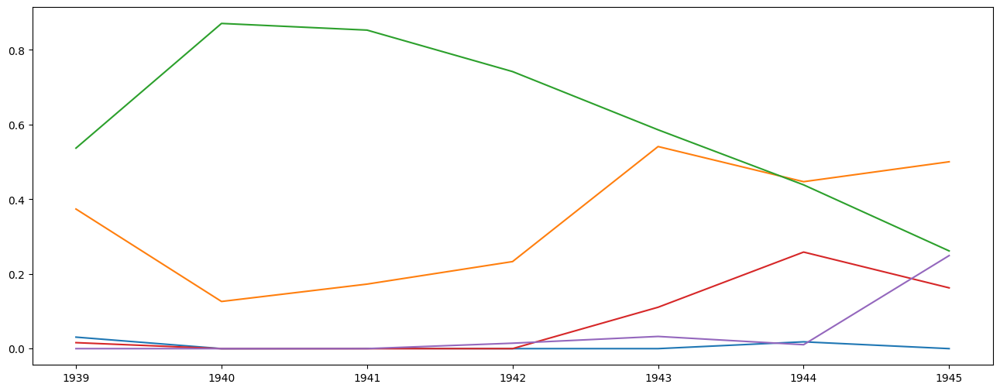

In [186]:
df = pd.read_csv("topic_years.csv")
import matplotlib.pyplot as plt 
df.set_index("year", inplace = True)
#plot individual lines
plt.plot(df['hitler topic 1'])
plt.plot(df['hitler topic 2'])
plt.plot(df['hitler topic 3'])
plt.plot(df['hitler topic 4'])
plt.plot(df['hitler topic 5'])

#display plot
plt.show()

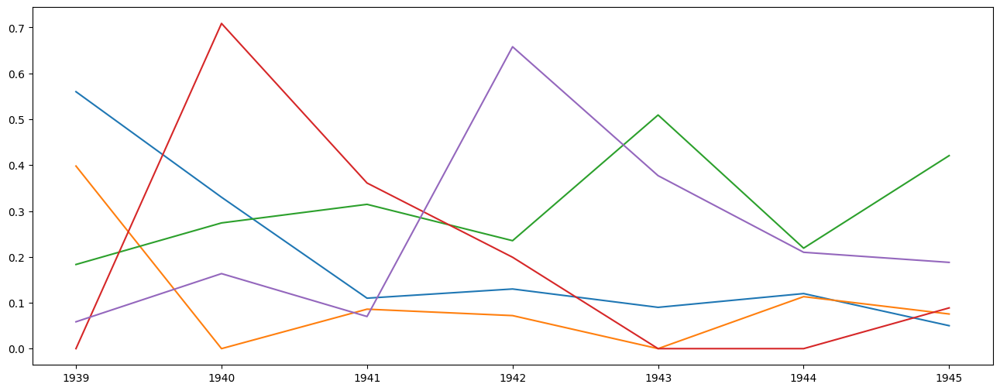

In [187]:
df = pd.read_csv("topic_years.csv")
import matplotlib.pyplot as plt 
df.set_index("year", inplace = True)
#plot individual lines
plt.plot(df['churchill topic 1'])
plt.plot(df['churchill topic 2'])
plt.plot(df['churchill topic 3'])
plt.plot(df['churchill topic 4'])
plt.plot(df['churchill topic 5'])

#display plot
plt.show()